<img src="./resources/cropped-SummerWorkshop_Header.png">  

<h1 align="center">DAY 3 Workshop SWDB 2025 </h1> 
<h3 align="center">Wednesday, August 27th, 2025</h3> 
<h3 align="center">How does network dynamics govern behavior?</h3> 

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">
    
<h2>Objectives</h2>
    
<p>By the end of this lesson, you will be able to

<p>-Think about physical and biological systems in terms of states and dynamical systems
<p>-Visualize the network state evolution of a recurrent neural network (RNN)
<p>-Identify the linear dynamics around fixed points
<p>-Think critically about the dynamical systems that implement various tasks

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

### Lorenz Attractor
*The Lorenz system is a system of ordinary differential equations first studied by mathematician and meteorologist Edward Lorenz. This chaotic system is completely deterministic and yet inherently unpredictable over long periods of time.*

<img src="./resources/lorenz.png" alt="Foraging Task Schematic" width=600>

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">
<h2>Dynamical Systems in Biology </h2> 
<p> As discussed in the lecture, a dynamical system is one that changes in time. There are often inputs to the system that shape how the state of the system changes in time. Fundamental to thinking about biological systems as dynamical systems is identifying a 'state' of the system that changes in time, and whatever inputs are the relevant ones that might change the way the state evolves in time. At a high level, it's very intuitive to think about how biological systems can be interpretted as having a state. You can be hungry, happy, angry or sad - and that might effect the way you interact with your environment. At a more microscopic level, you can also think about the conformational state of a protein that might change how it interacts with the environment and which other molecules it might form bonds with. In systems neuroscience, we often think of neural activity in terms of the activity rate of all the neurons that we record. Using this framework for thinking about the brain as a dynamical system, we can study how neural computation might be implemented through a dynamical system.
    
<p>In this tutorial, we will discuss dynamical systems in the context of computation and behavior. We will reverse engineer the dynamics of recurrent neural networks (RNNs) trained to solve a foraging task using reinforcement learning. At the end, we extrapolate to thinking about the dynamics for various neuroscience tasks.

<p>Through this analysis, we hope to gain a better understanding of how RNNs can solve complex sequential decision-making problems and potentially uncover general principles underlying their computational capabilities that will lead to hypotheses about how brains might implement the same task.</p>
</div>

<!-- # Understanding neural circuit and dynamics with recurrent neural networks
(First draft: Po-Chen Kuo 06.21.2024)
- task trained RNNs
- actor-critic RNNs solving dynamic foraging
- visualize RNN acticities using PCA
- dynamical systems analysis of RNN -->

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">
<h2>Dynamic Foraging: Two Armed Bandit Task </h2>
<p> We will model a two-armed bandit task, that scientists at the Allen Institute for Neural Dynamics are currently training mice to perform. In this task, mice must choose to lick either a left or right lick port. The probability of reward in either arm changes over time. One side is rewarded with a probability of 20% and the other side is rewarded 80% for a given block. Blocks are randomly switched with a Guassian distribution centered on 40 trials.

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">
<img src="./resources/dyn_foraging_task_schematic.png" alt="Foraging Task Schematic" width=600>

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">
<h2>RNNs solving dynamic foraging</h2>
<p>As our goal in this tutorial is to analyze RNN circuit and dynamics, here we provide RNNs readily trained with the actor-critic reinforcement learning algorithm to solve the dynamic foraging task. 

<img src="./resources/actor_critic_diagram.png" alt="Foraging Task Schematic" width=600>

<p>We will first look at the behavior of the network from example sessions.

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

## 1. Load and visualize data

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

*Main imports:*

</div>

In [1]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
%matplotlib inline

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

On each trial, the RNN receives the action (0/1 indicating left/right) and reward (0 or 1) from the previous trial as input, integrates this input with its hidden states, and generates an action (0/1 indicating left/right) as output

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

*Define hyperparameters:*

</div>

In [2]:
action_dim = 2
total_trials = 400
rnn_hidden_dim = 64

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

*Load example sessions:*

</div>

In [3]:
with open(f'./data/info_testing_set.pickle', 'rb') as f:
    info_testing_set = pickle.load(f)

actions_testing_set = np.load('./data/actions_testing_set.npy')
rewards_testing_set = np.load('./data/rewards_testing_set.npy')
a1_probs_testing_set = np.load('./data/a1_probs_testing_set.npy')
actor_hidden_states_testing_set = np.load('./data/actor_hidden_states_testing_set.npy', )

In [13]:
# format of the data
session_selected = 0
trial_selected = 0

print(f'number of sessions in the testing set: {actions_testing_set.shape[0]}')
print(f'number of trials per session: {actions_testing_set.shape[1]}')

print(f'action (choice) data: {actions_testing_set.shape},\n    example trial action: {actions_testing_set[session_selected, trial_selected]}')
print(f'reward data: {rewards_testing_set.shape},\n    example trial reward: {rewards_testing_set[session_selected, trial_selected]}')

print('\nSince we have full access to the RNN model, we have further measure on:')
print(f'action probability (p(a1)) data: {a1_probs_testing_set.shape},\n    example trial p(a1): {a1_probs_testing_set[session_selected, trial_selected]}')
print(f'RNN hidden states (neural activities) data: {actor_hidden_states_testing_set.shape},\n    example trial RNN hidden states: {actor_hidden_states_testing_set[session_selected, trial_selected]}')

number of sessions in the testing set: 3
number of trials per session: 400
action (choice) data: (3, 400),
    example trial action: 1
reward data: (3, 400),
    example trial reward: 0.0

Since we have full access to the RNN model, we have further measure on:
action probability (p(a1)) data: (3, 400),
    example trial p(a1): 0.5702118277549744
RNN hidden states (neural activities) data: (3, 400, 64),
    example trial RNN hidden states: [-0.00205488 -0.05047991 -0.05481633 -0.00822655  0.03015254  0.07722903
 -0.1061539   0.05855748 -0.04449313  0.11084621 -0.00034806  0.04223983
 -0.03102688  0.09700216  0.02986814  0.00103077  0.03161723 -0.01232062
 -0.08711351  0.07366219 -0.01614087  0.010347   -0.05404567 -0.03076697
  0.03455832  0.21950641  0.0323652   0.01886306  0.04169891 -0.04791458
 -0.12369032 -0.01532378  0.01283315 -0.01461116  0.02042892  0.11099856
  0.04798644 -0.06242022  0.03542153 -0.01263289 -0.02822787 -0.01739529
  0.03323704  0.03939535 -0.02797378  0.000988

In [20]:
print('Info contains: ')
for key in ['block_lens', 'reward_prob']:
    print(f'{key}: {info_testing_set[session_selected][key]}')

Info contains: 
block_lens: [47 33 42 36 48 38 30 47 34 45]
reward_prob: [(0.2, 0.8), (0.8, 0.2), (0.2, 0.8), (0.8, 0.2), (0.2, 0.8), (0.8, 0.2), (0.2, 0.8), (0.8, 0.2), (0.2, 0.8), (0.8, 0.2)]


<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

*Select the first example session:*

</div>

In [21]:
example_session_id = 2
info = info_testing_set[example_session_id]
actions = actions_testing_set[example_session_id]
rewards = rewards_testing_set[example_session_id]
a1_probs = a1_probs_testing_set[example_session_id]
actor_hidden_states = actor_hidden_states_testing_set[example_session_id]

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

*Plot the behavior from example session:*

</div>

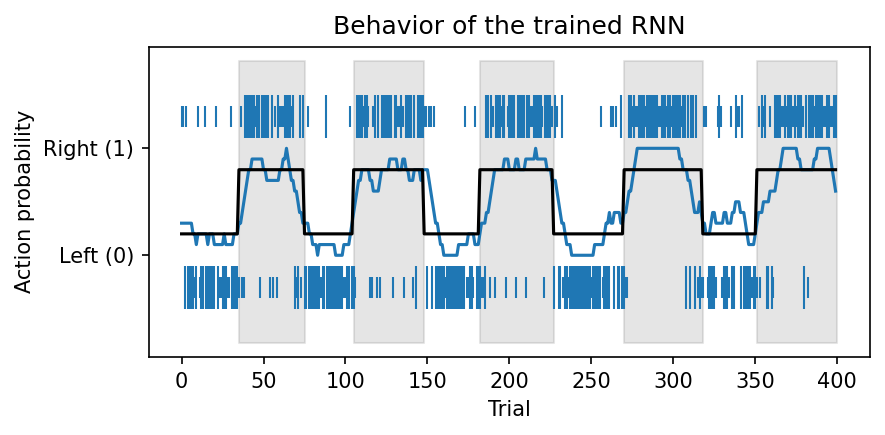

In [22]:
def shading_blocks(ax, info):

    y_min, y_max = ax.get_ylim()
    block_start = 0
    for block_ind in range(len(info['block_lens'])):
        if block_ind % 2 == 1:
            ax.fill_between(
                [block_start, block_start+info['block_lens'][block_ind]],
                y_min, y_max,
                color='gray', alpha=0.2
            )
        block_start += info['block_lens'][block_ind]

        
fig, ax = plt.subplots(1,1, figsize=(6, 3), dpi=150)
ax.set_title(f'Behavior of the trained RNN')

# event raster
events = []
for act in range(action_dim):
    # 0: action 0, 1: action 1
    for rew in [0, 1]:
        events_act_rew = np.where(
            (actions==act) & (rewards==rew))[0]
        events.append(events_act_rew)
line_offsets = [-0.3,-0.3] + [1.3,1.3]
line_lengths = [0.2,0.4] + [0.2,0.4]
ax.eventplot(events, lineoffsets=line_offsets, 
            linelengths=line_lengths, linewidth=1)

# action running average
running_average_window = 10
actions_moving_average = np.convolve(
    np.array(actions), np.ones(running_average_window), mode="same") \
        / running_average_window
ax.plot(
    np.arange(len(actions_moving_average)), 
    actions_moving_average
)

# block reward prob: action 1 
# get blocks
rew_prob_a1 = []
for block_idx, block_len in enumerate(info['block_lens']):
    for trial_idx in range(block_len):
        rew_prob_a1.append(info['reward_prob'][block_idx][1])
block_reward_prob_color = 'k'
            
ax.plot(
    np.arange(len(rew_prob_a1)),
    rew_prob_a1, 
    c=block_reward_prob_color
)
shading_blocks(ax, info)

ax.set_xlabel('Trial')
ax.set_ylabel('Action probability')
ax.set_yticks([0, 1])
ax.set_yticklabels(['Left (0)', 'Right (1)'])

fig.tight_layout()

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

*Plot the output: policy or action probability:*

</div>

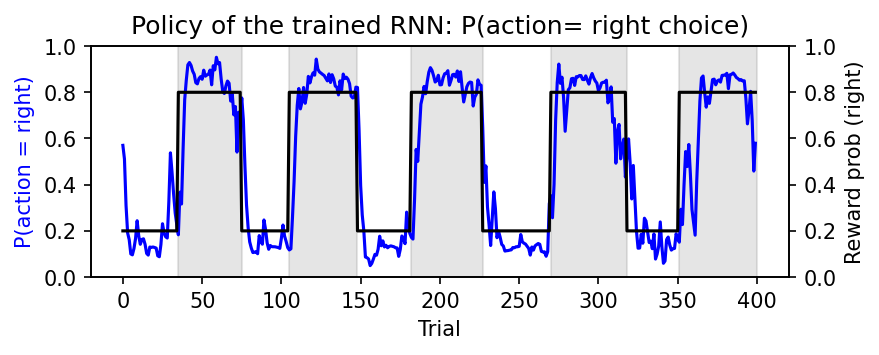

In [29]:
fig, ax = plt.subplots(1,1, figsize=(6, 2), dpi=150)
ax.set_title(f'Policy of the trained RNN: P(action= right choice)')

colors = ['b']

arr = a1_probs
ax.plot(np.arange(len(arr)), arr, label='prob_a1', color=colors[0])

ax.set_xlabel('Trial')
ax.set_ylabel('P(action = right)', color=colors[0])
ax.set_ylim(0, 1)

shading_blocks(ax, info)

# block reward prob: action 1
ax = ax.twinx()
ax.plot(
    np.arange(len(rew_prob_a1)),
    rew_prob_a1, 
    c=block_reward_prob_color
)
ax.set_ylabel('Reward prob (right)', c=block_reward_prob_color)
ax.tick_params(axis='y', labelcolor=block_reward_prob_color)
ax.set_ylim(0, 1);

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

*Plot RNN activity (activities of example individual units):*

</div>

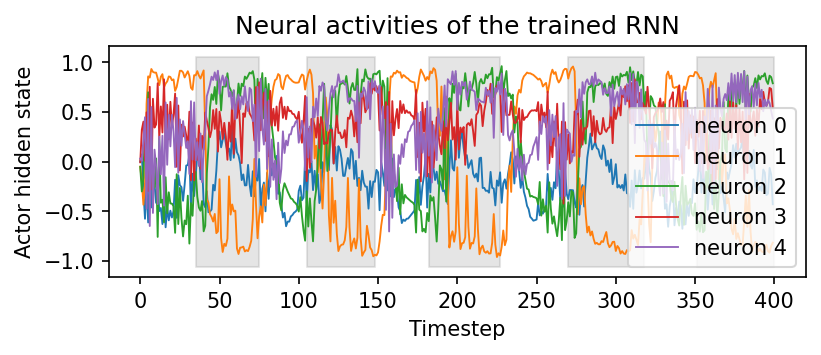

In [30]:
n_hidden_units_plot = 5

fig, ax = plt.subplots(1,1, figsize=(6, 2), dpi=150)
ax.set_title(f'Neural activities of the trained RNN')

for plot_id in range(n_hidden_units_plot):
    arr = actor_hidden_states[:, plot_id]
    ax.plot(arr, lw=0.9, label=f'neuron {plot_id}')

shading_blocks(ax, info)

ax.set_xlabel('Timestep')
ax.set_ylabel('Actor hidden state')
ax.legend();

<div style="background: #DFF0D8; border-radius: 3px; padding: 10px;">

* **Exercise:** plot the above for another session 
* **Discussion:** what's the difference between each session?

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

## 2. Visualize RNN activities using PCA

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

To better visualize and understand network dynamics of the trained network, we can apply dimensionality reduction methods to extract relevant dimensions within the high-dimensional neural activity space. 
One example method is principal component analysis (PCA), which captures the dimensions that explain the most variances within our dataset.

<img src="./resources/pca.png" alt="PCA" width=1500>

(Ref: Pang, R., Lansdell, B. J., & Fairhall, A. L. (2016). Dimensionality reduction in neuroscience. Current Biology, 26(14), R656-R660.)

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

*Load training set:*

</div>

In [31]:
with open(f'./data/info_training_set.pickle', 'rb') as f:
    info_training_set = pickle.load(f)

actions_training_set = np.load('./data/actions_training_set.npy')
rewards_training_set = np.load('./data/rewards_training_set.npy')
a1_probs_training_set = np.load('./data/a1_probs_training_set.npy')
actor_hidden_states_training_set = np.load('./data/actor_hidden_states_training_set.npy')

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

**Quick check:** how many sessions do we have in the training set?

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

*Perform PCA on the training set:*

</div>

In [32]:
from sklearn.decomposition import PCA

num_components = 8

pca_model_actor = PCA(n_components=num_components)
transformed_actor_hidden_states_training_set = pca_model_actor.fit_transform(actor_hidden_states_training_set.reshape(-1, rnn_hidden_dim)).reshape(
    -1, total_trials, num_components)

print(f'PCA explained variance: {pca_model_actor.explained_variance_ratio_}')

PCA explained variance: [0.4825754  0.26310498 0.05446956 0.03926742 0.03151708 0.02692776
 0.01992995 0.01817609]


<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

*Plot variance explained by the top principal components (individual and cumulative):*

</div>

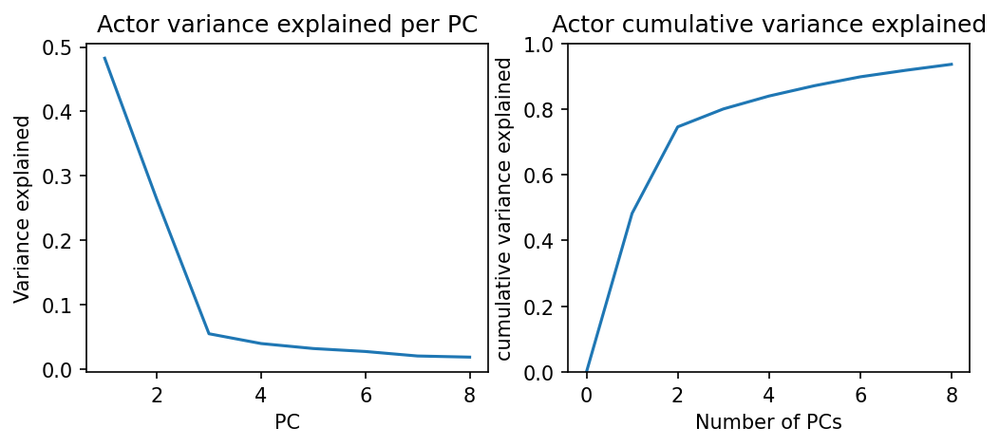

In [33]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8, 3), dpi=150)

ax = axs[0]
ax.plot(np.arange(1, len(pca_model_actor.explained_variance_ratio_)+1), pca_model_actor.explained_variance_ratio_)
ax.set_title('Actor variance explained per PC')
ax.set_xlabel('PC')
ax.set_ylabel('Variance explained')

ax = axs[1]
ax.plot(np.hstack(([0], np.cumsum(pca_model_actor.explained_variance_ratio_))))
ax.set_title('Actor cumulative variance explained')
ax.set_xlabel('Number of PCs')
ax.set_ylabel('cumulative variance explained')
ax.set_ylim(0, 1);

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

*Visualize network activity projected into the first two PCs:*

</div>

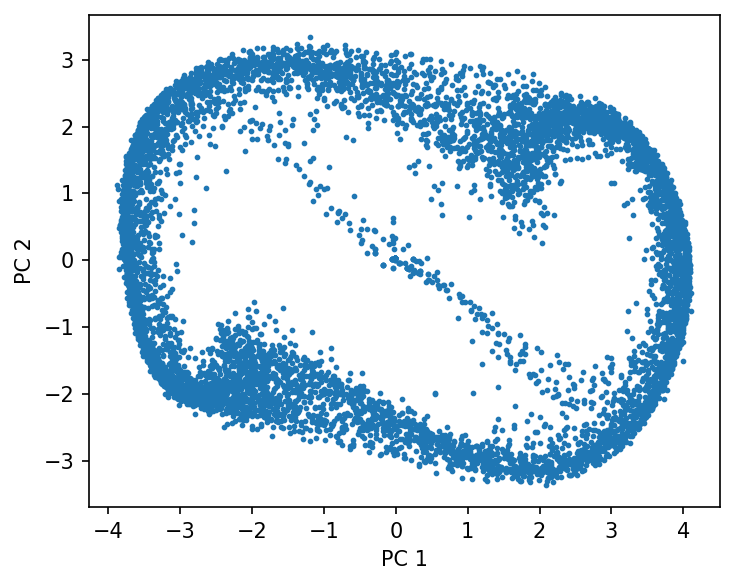

In [38]:
fig, ax = plt.subplots(1,1, figsize=(5,4), dpi=150)

pc_x = 0
pc_y = 1

scatter = ax.scatter(
    transformed_actor_hidden_states_training_set[:, :, pc_x],
    transformed_actor_hidden_states_training_set[:, :, pc_y],
    s=3.0,
    # c=VAR_TO_COLOR, 
    # cmap=cm.coolwarm,
    # vmin=0, 
    # vmax=1,
)

ax.set_xlabel(f'PC {pc_x+1}')
ax.set_ylabel(f'PC {pc_y+1}')
# cb = fig.colorbar(scatter, ax=ax, label = VAR_TO_COLOR)

fig.tight_layout()

<div style="background: #DFF0D8; border-radius: 3px; padding: 10px;">

**Exercise:** uncomment the lines and modify the code above to color the scatter plot according to relevant task variables. Variables to try: `rewards_training_set` (reward outcome), `actions_training_set` (action outcome), `a1_probs_training_set` (action probability). 

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

Let us see how a single test episode unfolds. Note that here we use the session loaded above (defined by `example_session_id`).

*Visualize a test episode by projecting its neural activity into the first two PCs calculated using training data set:*

</div>

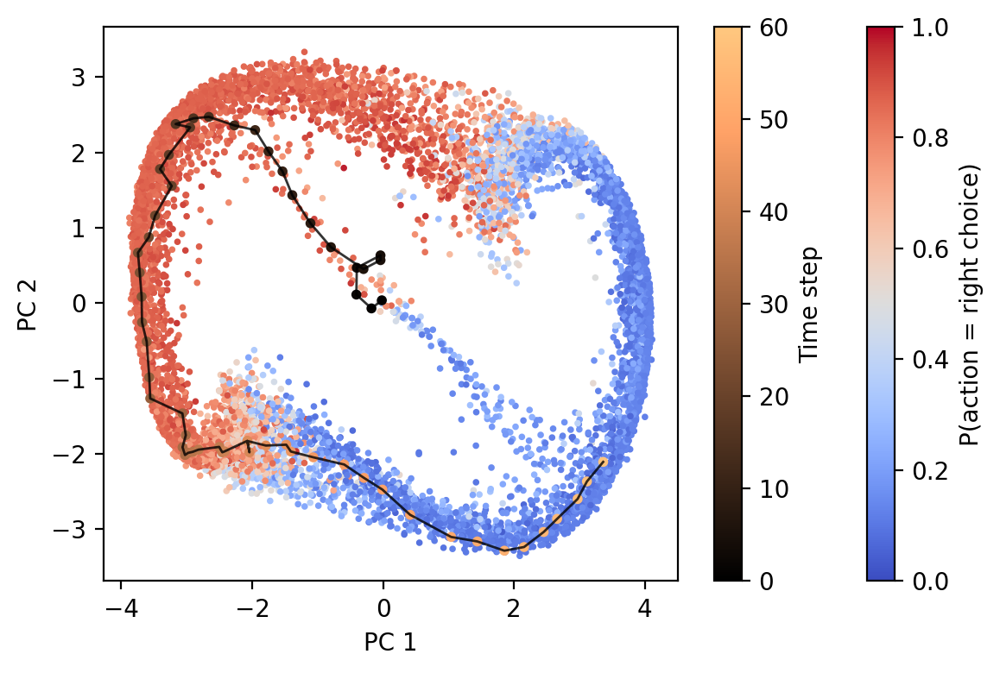

In [39]:
# transform the test set first
transformed_actor_hidden_states_testing_set = pca_model_actor.transform(
    actor_hidden_states_training_set.reshape(-1, rnn_hidden_dim))
transformed_actor_hidden_states_testing_set = transformed_actor_hidden_states_testing_set.reshape(
    -1, total_trials, num_components)

# how many steps to visualize
trial_end = 60

fig, ax = plt.subplots(1,1, figsize=(6,4), dpi=200)

pc_x = 0
pc_y =1

# plot all trials
scatter = ax.scatter(
    transformed_actor_hidden_states_training_set[:, :, pc_x],
    transformed_actor_hidden_states_training_set[:, :, pc_y],
    s=3.0,
    c=a1_probs_training_set, cmap=cm.coolwarm,
    vmin=0, vmax=1,
)
fig.colorbar(scatter, ax=ax, label = 'P(action = right choice)')

# plot example run
ax.plot(
    transformed_actor_hidden_states_testing_set[example_session_id, :trial_end, pc_x],
    transformed_actor_hidden_states_testing_set[example_session_id, :trial_end, pc_y],
    color='k', alpha=0.8, lw=1
)
example_run = ax.scatter(
    transformed_actor_hidden_states_testing_set[example_session_id, :trial_end, pc_x],
    transformed_actor_hidden_states_testing_set[example_session_id, :trial_end, pc_y],
    s=10,
    c=np.arange(trial_end), cmap=cm.copper,
    vmin=0, vmax=trial_end
)  # color coded by time step
fig.colorbar(
    example_run, ax=ax,
    label='Time step'
)

ax.set_xlabel(f'PC {pc_x+1}')
ax.set_ylabel(f'PC {pc_y+1}')

fig.tight_layout()

<div style="background: #DFF0D8; border-radius: 3px; padding: 10px;">

**Exercises:** 
* Play with the `trial_end` parameter above, explore how the RNN activities evolve in the PC space.
* Visualize activity projected onto other PCs, what do you find?

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

*Create an animation:*

</div>

In [46]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import imageio
import io
import os
from utils import create_frame

import platform

if 'amzn2' in platform.platform():
    DIR_RESULTS = '/results'    # use within the capsule
    # DIR_RESULTS = '/scratch'    # use within the capsule
else:
    DIR_RESULTS = '.'           # use to store files within the same directory instead

# Create frames
def make_mov(n_frames=360, azim_start=60, axes_set=[0,1,2]):
    frames = []
    fig = plt.figure(figsize=(10, 8), dpi=150)
    ax = fig.add_subplot(111, projection='3d')

    for i in range(n_frames):
        # Clear the previous frame
        ax.clear()

        # Calculate elevation and azimuth for this frame
        elev = 30 + 30 * np.sin(2 * np.pi * i / 360)
        azim = azim_start + 360 * i / 360  # Full 360 degree rotation

        # Create the frame
        buf = create_frame(transformed_actor_hidden_states_training_set, transformed_actor_hidden_states_testing_set, 
                           a1_probs_training_set, example_session_id, elev, azim, axes_set=axes_set, frame=i)
        frame = imageio.v2.imread(buf)
        frames.append(frame)

        # Update progress
        if i % 10 == 0:
            print(f"Processed frame {i}/{n_frames}")

    # Save as GIF
    axes_set_str = '_'.join(str(x) for x in axes_set)
    dir_mov = os.path.join(DIR_RESULTS, 'movs')
    os.makedirs(dir_mov, exist_ok=True)
    path_mov = os.path.join(dir_mov, f'rotating_3d_plot_2rotationaxes{axes_set_str}.gif')
    imageio.mimsave(path_mov, frames, fps=5)

    plt.close(fig)

In [43]:
make_mov(n_frames = 60, azim_start = 0, axes_set = [0,1,2])

Processed frame 0/60
Processed frame 10/60
Processed frame 20/60
Processed frame 30/60
Processed frame 40/60
Processed frame 50/60


<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

The animation should be available in `/results/movs/`.

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

## 3. Dynamical systems analysis of RNN

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

### Finding approximate fixed points
Here we aim to find approximate fixed points. For a given dynamical system (e.g. the trained RNN),
\begin{align}
    \frac{d\mathbf{x}}{dt} = F(\mathbf{x}),
\end{align}

We can find approximated fixed points by minimizing the kinetic energy of the system, $q$.
\begin{align}
    \mathrm{argmin}_{\mathbf{x}}  q = \frac{1}{2} (F(\mathbf{x}))^2.
\end{align}

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

Because there are five different input conditions (prev_action, prev_reward) for our task: null, (0, 1), (0, 0), (1, 0), (1, 1), we can find fixed points of the trained RNN under these conditions respectively. To empirically identify fixed points, initialize along the trajectory of the network state and move down the gradient of the q value, defined above. Save approximate fixed point locations once they meet a pre-defined q threshold. Here, we provide pre-computed fixed points, computed with `q_threshold=0.001`.

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

*Load the pre-computed fixed points:*

</div>

In [44]:
fps_path = './data/df_fps_dict_250718.pickle'
with open(fps_path, 'rb') as f:
    df_fps_per_condition = pickle.load(f)

In [50]:
print(f'input conditions: {list(df_fps_per_condition.keys())}')

condition_names = {
    '0+': 'rewarded left',
    '0-': 'unrewarded left',
    '1+': 'rewarded right',
    '1-': 'unrewarded right',
    'null': 'first trial'
}

input_condition = '0+'
print(f'for input condition: {input_condition} ({condition_names[input_condition]})')
df_fps_per_condition[input_condition].head()

input conditions: ['0+', '0-', '1+', '1-', 'null']
for input condition: 0+ (rewarded left)


,x_init,x_star,q_star,dq,n_iters,x_star_jac
88263,"[-1.4640428, 1.5021058, -2.3737395, 0.8023188,...","[-0.3847876, 0.9289665, -0.36271665, 0.1454998...",9.228772e-10,4.110831e-10,30000.0,"[[0.15354685, 0.12319411, 0.14502662, -0.11245..."
89046,"[1.1406332, -1.8428874, 0.67138153, -0.9777787...","[-0.3847915, 0.9289634, -0.36271408, 0.1454978...",1.898122e-10,1.659446e-11,30000.0,"[[0.15354744, 0.12319457, 0.14502716, -0.11245..."
89229,"[0.038859084, -0.410226, 0.5043232, -0.2641320...","[-0.3847914, 0.9289594, -0.36271572, 0.1454997...",7.368962e-10,1.828249e-10,30000.0,"[[0.15354757, 0.12319468, 0.1450273, -0.112453..."
87119,"[-0.80491054, 1.6755841, 0.0013763905, 0.59475...","[-0.3847911, 0.9289637, -0.3627149, 0.1454993,...",8.285476e-11,4.373536e-11,30000.0,"[[0.15354739, 0.12319454, 0.14502713, -0.11245..."
88445,"[-1.165127, 0.0075555146, 0.33712578, 0.755229...","[-0.3847897, 0.9289628, -0.36271685, 0.1455013...",5.521982e-10,3.909826e-10,30000.0,"[[0.15354732, 0.12319448, 0.14502707, -0.11245..."


<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

*Visualize the fixed points under different input conditions in the PC space:*

</div>

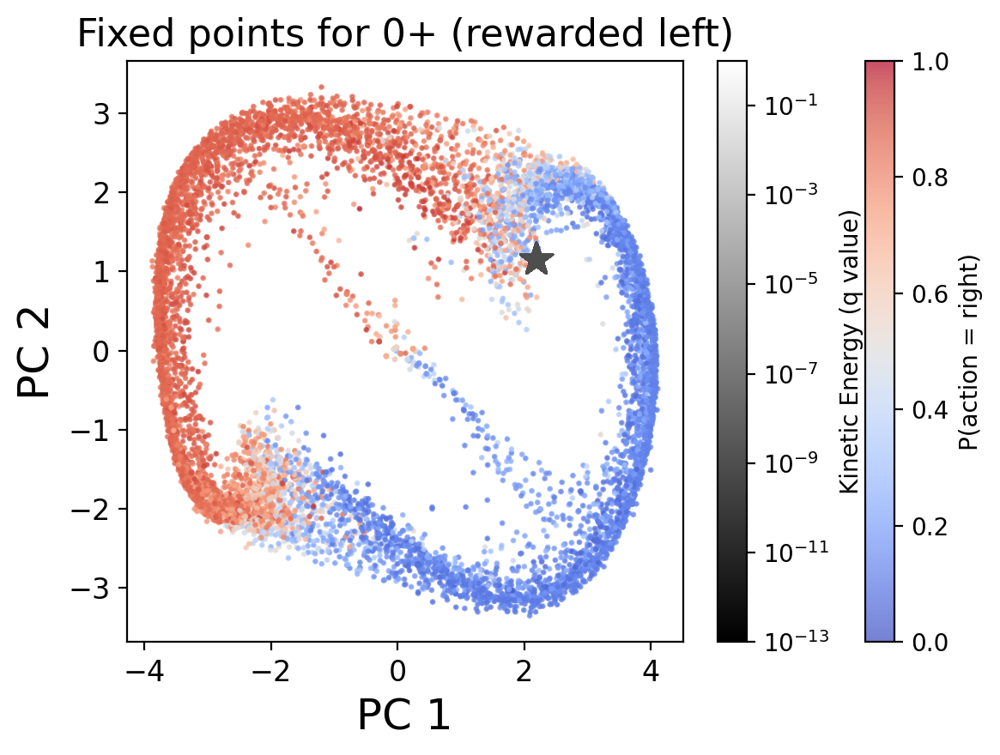

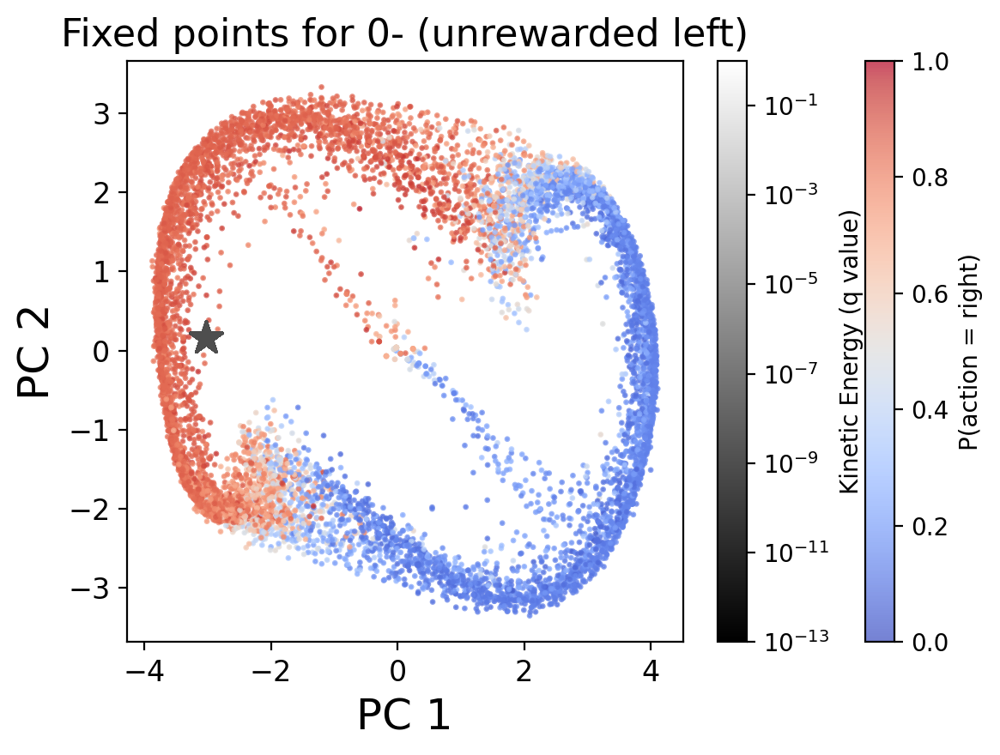

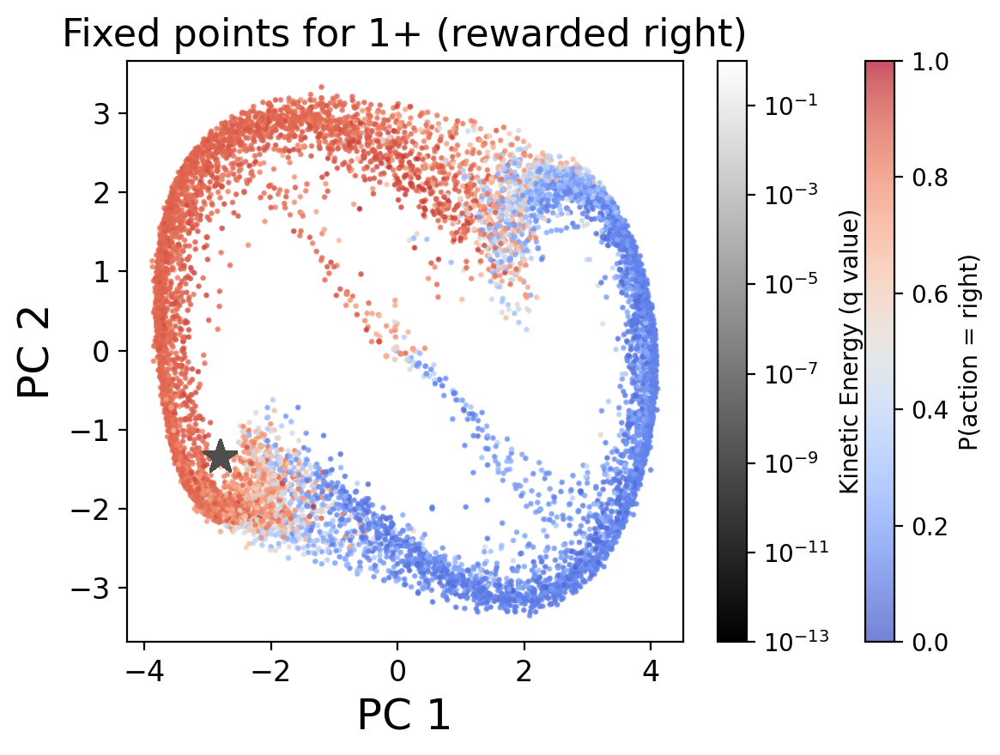

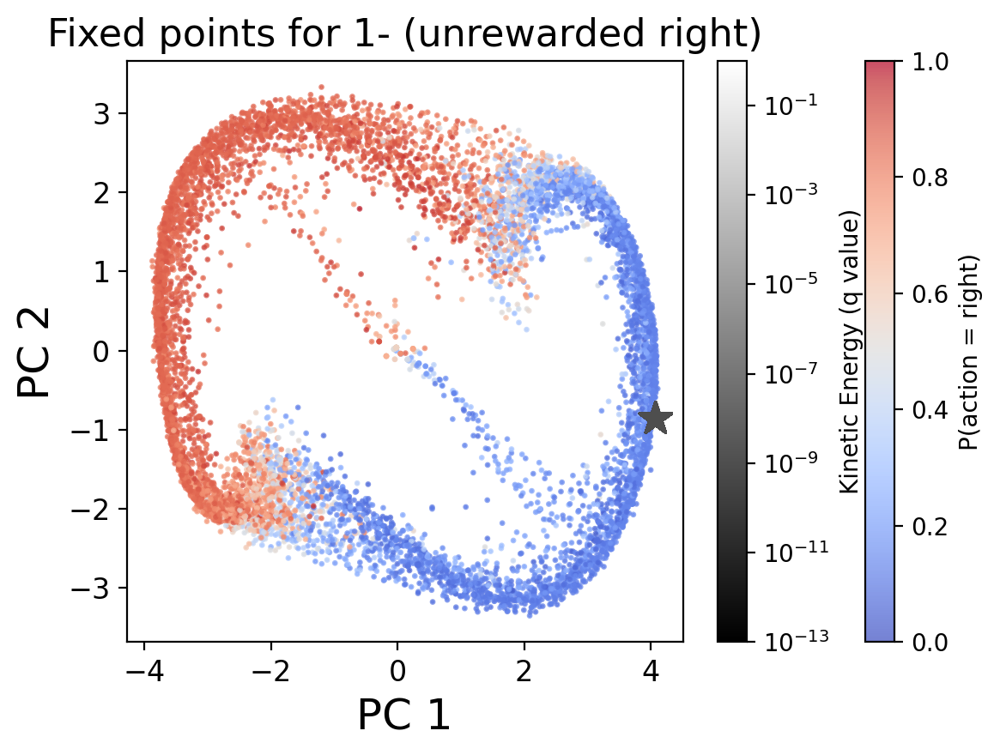

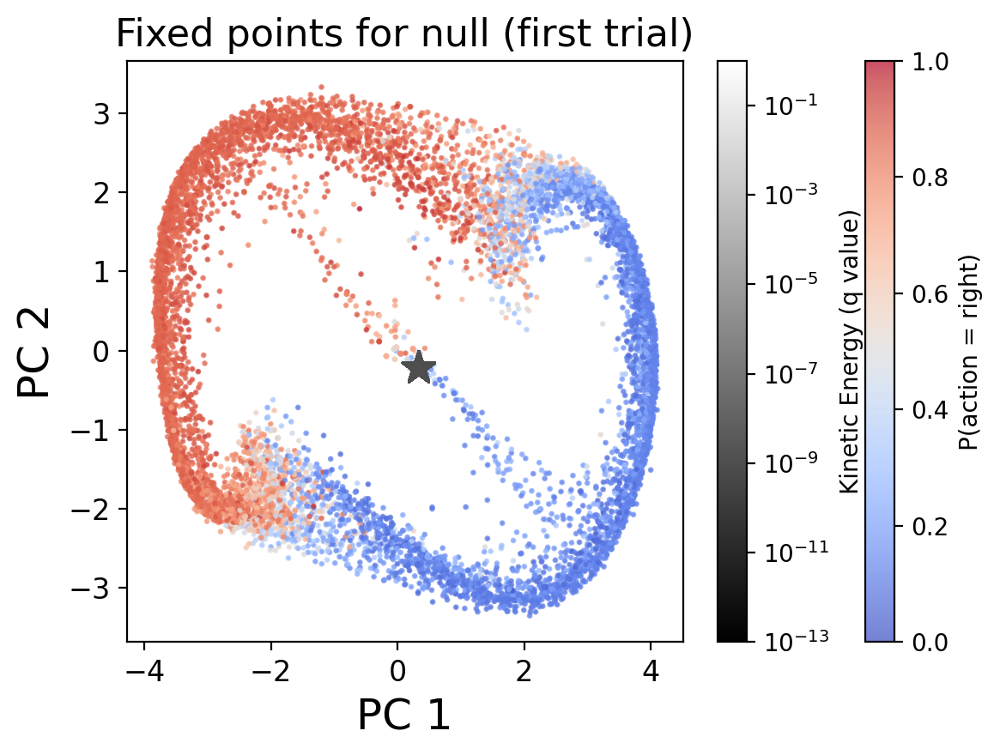

In [53]:
# input condition
# (0,1) labeled 0+
# (0,0) labeled 0-
# (1,1) labeled 1+
# (1,0) labeled 1-
# 'null': no action, no reward

# set a q_threshold to select fixed points with q smaller than the threshold
q_threshold = .00001


for condition in ['0+', '0-', '1+', '1-', 'null']:
    df_select = df_fps_per_condition[condition]
    
    # filter by q_threshold
    df_select = df_select[df_select['q_star'] <= q_threshold].sort_values(by='q_star')
    qstar = df_select['q_star'].values
    
    # transform the fixed points
    fixed_points = df_select['x_star'].values
    fixed_points = np.vstack(fixed_points[:]).astype(float)  # convert object arr to float arr
    transformed_fixed_points = pca_model_actor.transform(
        fixed_points.reshape(-1, rnn_hidden_dim))

    # plot
    fig, ax = plt.subplots(
        nrows=1, ncols=1, figsize=(6, 4.5), dpi=200)

    # plot the first 2 PCs
    pc_x = 0
    pc_y = 1

    ax.set_title(f'Fixed points for {condition} ({condition_names[condition]})', fontsize=16)
    scatter = ax.scatter(
        transformed_actor_hidden_states_training_set[:, :, pc_x],
        transformed_actor_hidden_states_training_set[:, :, pc_y],
        c=a1_probs_training_set, cmap=cm.coolwarm,
        vmin=0, vmax=1, s=2, alpha=0.7
    )
    scatter_fp = ax.scatter(
        transformed_fixed_points[:, pc_x],
        transformed_fixed_points[:, pc_y],
        marker='*', 
        s=200,
        # color='k', 
        c=qstar, cmap=cm.gray,
        vmin=1e-13, vmax=1, norm='log',
    )
    ax.set_xlabel(f'PC {pc_x+1}', fontsize=18)
    ax.set_ylabel(f'PC {pc_y+1}', fontsize=18)
    
    ax.tick_params(axis='both', which='major', labelsize=12)
    fig.colorbar(scatter, ax=ax, label = 'P(action = right)')
    fig.colorbar(scatter_fp, ax=ax, label = 'Kinetic Energy (q value)')
    fig.tight_layout()

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

## 4. Linear Dynamical Systems Analysis

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

### Linear dynamical systems analysis
*Stability of a fixed point can be characterized as stable, saddle, or unstable, based on the real part of its Jacobian eigenvalue.*

<img src="./resources/linear_stability_analysis.png" alt="Linear stability analysis" width=900>

(See Reading section for the mathematical details)

</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

*Visualize fixed points and their Jacobian eigenvalues:*

</div>

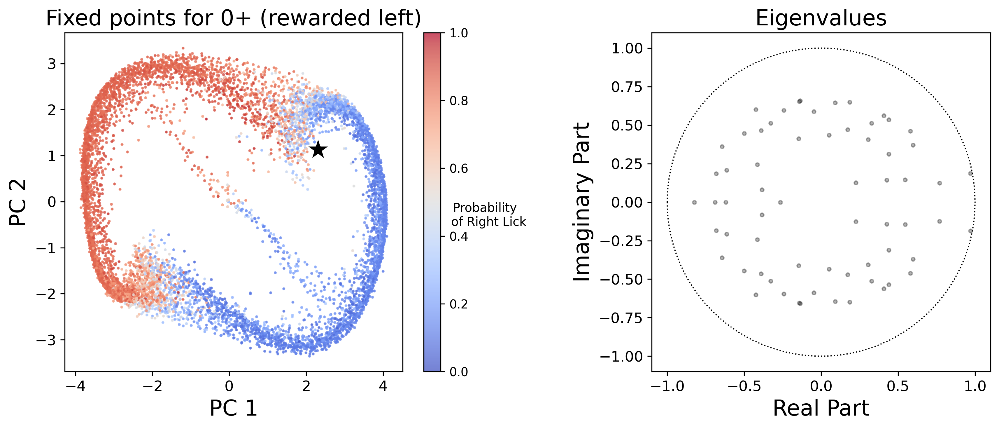

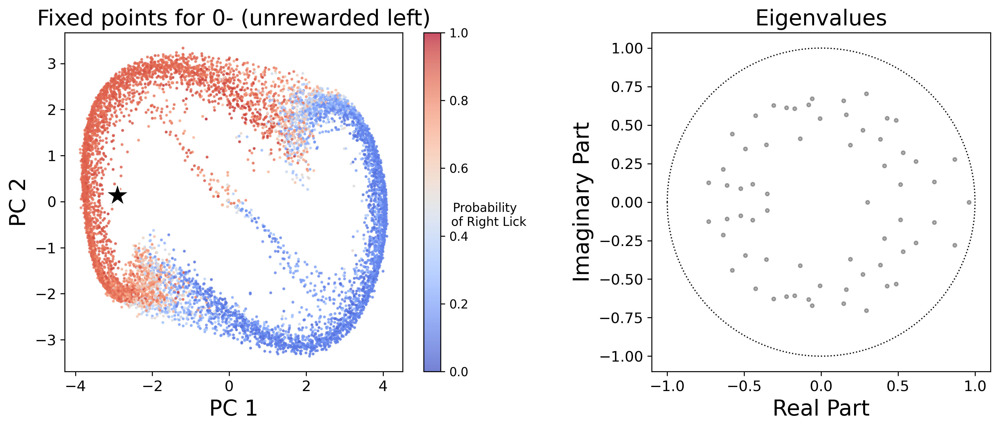

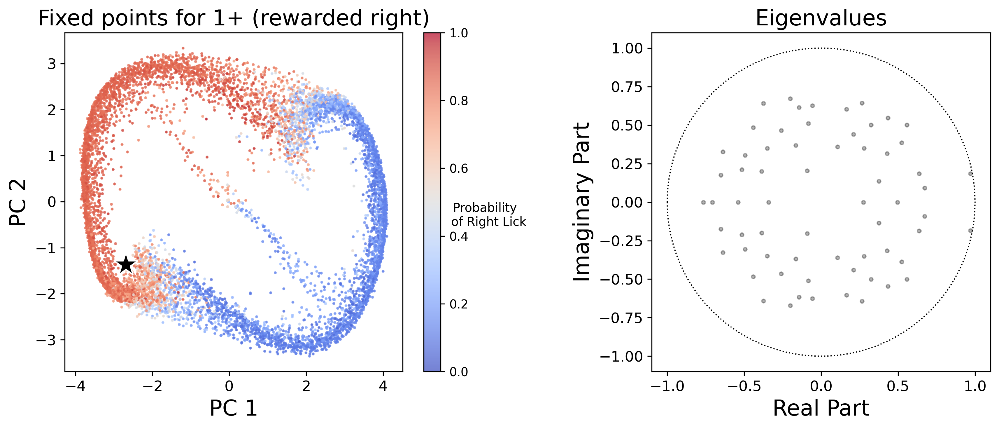

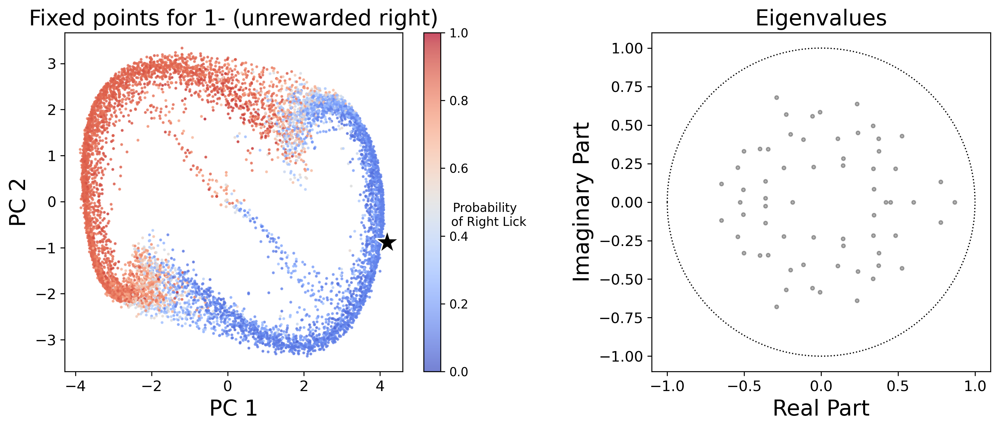

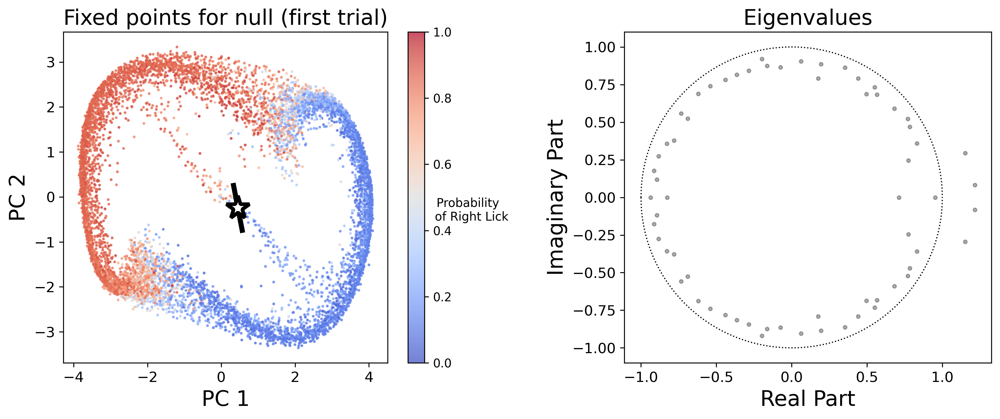

In [54]:
from utils import comp_eig_decomp, plot_FPs

for condition in ['0+', '0-', '1+', '1-', 'null']:
    
    # filter by q_threshold
    """This section filters the dataframe df_fps_per_condition to select the fixed point 
    with the smallest q_star value for the current condition."""
    
    df_sorted = df_fps_per_condition[condition].sort_values(by=['q_star'], ascending=True)
    # df_select = df_sorted.iloc[[pre_identified_fixed_points[condition],]]
    df_select = df_sorted.iloc[:10]
    qstar = df_select['q_star'].values
    
    # transform the fixed points
    """The fixed points are converted to a floating-point array and then projected 
    into a lower-dimensional space using PCA. This transformation helps in visualizing 
    the fixed points in a reduced feature space."""
    
    fixed_points = df_select['x_star'].values
    fixed_points = np.vstack(fixed_points[:]).astype(float)  # convert object arr to float arr
    transformed_fixed_points = pca_model_actor.transform(
        fixed_points.reshape(-1, rnn_hidden_dim))
    
    # get Jacobians eigendecomposition
    """This segment extracts Jacobian matrices, reshapes them, and performs an 
    eigendecomposition. The eigenvalues are crucial for understanding the stability 
    of the fixed points; eigenvalues inside the unit circle will indicate stability in 
    a discrete dynamical system."""
    
    fp_Jacs = df_select['x_star_jac'].T.values
    fp_Jacs = np.vstack(fp_Jacs[:]).astype(float)  # convert object arr to float arr
    fp_Jacs = fp_Jacs.reshape(-1, rnn_hidden_dim, rnn_hidden_dim)

    eig_decomps = comp_eig_decomp(fp_Jacs, sort_by='real',do_compute_lefts=True)

    
    # plot
    """A figure with two subplots is created.
    
    Plot 1: The first subplot displays the fixed points and the expanding 
    dimensions in the PCA-transformed space. Points are color-coded based on 
    the probability of a particular outcome (e.g., "Right Lick").
    
    Plot 2: The second subplot shows the eigenvalues on the complex plane. 
    Eigenvalues are plotted as dots, and the unit circle is drawn to indicate 
    the boundary between stable and unstable dimensions.
    """
    
    fig, ax = plt.subplots(
        nrows=1, ncols=2, figsize=(12, 5), dpi=300)

    # Plot Eigenspectrum

    # Unit circle marks boundary for stability
    """
    The unit circle in the eigenvalue plot marks the boundary for stability. 
    Eigenvalues inside this circle suggest contracting dynamics, which are associated 
    with stability.
    """
    ax[1].set_title('Eigenvalues', fontsize=18)
    xs = np.linspace(-1, 1, 1000)
    ys = np.sqrt(1 - xs**2)
    ax[1].plot(xs, ys,':k',linewidth = 1)
    ax[1].plot(xs, -ys,':k',linewidth = 1)
    
    ### Eigenvalues within the unit circle correspond to contracting dimensions
    ax[1].plot(
        eig_decomps[0]['evals'].real, 
        eig_decomps[0]['evals'].imag,
        '.k', 
        alpha = .3,
        markerfacecolor = 'k'
    )

    # Eigenspectum labels
    ax[1].tick_params(axis='both', which='major', labelsize=12)
    ax[1].set_xlabel('Real Part', fontsize=18)
    ax[1].set_ylabel('Imaginary Part', fontsize=18)
    # plt.xticks(fontsize = 18)
    # plt.yticks(fontsize = 18)
    ax[1].set_aspect('equal') 
    

    ax[0].set_title(f'Fixed points for {condition} ({condition_names[condition]})', fontsize=18)
    
    # Chose which PCs to plot
    pc_x = 0
    pc_y = 1
    scatter = ax[0].scatter(
        transformed_actor_hidden_states_training_set[:, :, pc_x],
        transformed_actor_hidden_states_training_set[:, :, pc_y],
        c=a1_probs_training_set, 
        cmap=cm.coolwarm,
        vmin=0, vmax=1, 
        s=2, alpha=0.7
    )

    # PC axes labels
    ax[0].set_xlabel(f'PC {pc_x+1}', fontsize=18)
    ax[0].set_ylabel(f'PC {pc_y+1}', fontsize=18)
    ax[0].tick_params(axis='both', which='major', labelsize=12)
    
    # Colorbar label
    cbar = fig.colorbar(scatter, ax=ax[0])
    cbar.set_label('Probability \n of Right Lick', rotation=0, labelpad=15, ha='center', va='top')
    fig.tight_layout()

    # Plot Fixed Points
    principal_components = pca_model_actor.components_
    D_use = principal_components[[pc_x,pc_y],:].T
    plot_FPs(ax[0],fixed_points, eig_decomps, D_use, plot_expansion = True, rf=2)

    plt.show()

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

### Key Points:

- **Contracting vs. Expanding Dimensions:** Eigenvalues reveal local stability:
  - Magnitude **< 1**: Contracting, indicating stability.
  - Magnitude **> 1**: Expanding, indicating instability.
- **Practical Implications:** Identifies stable and unstable regions in the state space, crucial for understanding system behavior and robustness.


</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

## 5. Stability Analysis Using Perturbation Analysis

In the previous section, we calculated the stable and unstable dimensions of fixed points using linear stability analysis. In this section we will empirically calculate stability.

**Objective:** Assess the stability of dynamics near fixed points by perturbation analysis, using Gaussian point clouds to observe how small perturbations in the network state around fixed points evolve over time.

### Steps:

1. Create a small Gaussian cloud around each fixed point. This is a cloud of points generated from a normal distribution centered at the fixed point.

2. Let the initial Gaussian cloud evolve according to the RNN dynamics. This simulates how small perturbations behave over time.

3. Compare the distribution of points after evolution to determine stability. Points that cluster towards the fixed point indicate stability, while those moving away suggest instability.

By following these steps, we evaluate the stability of fixed points and understand the system’s response to perturbations. We can also compare these results to the linear stability analysis in the previous section.


</div>

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

*Load precomputed initial and evolved point clouds:*

</div>

In [55]:
# The initial random points and the final points after evolution are pre-computed and provided
# Here we have three different diameter for the initial Gaussian balls
with open(f'./data/perturbation_0.05_init_points_dict.pickle', 'rb') as f:
    init_points_dict_005 = pickle.load(f)
with open(f'./data/perturbation_0.05_final_points_dict.pickle', 'rb') as f:
    final_points_dict_005 = pickle.load(f)

# with open(f'./data/perturbation_0.2_init_points_dict.pickle', 'rb') as f:
#     init_points_dict_02 = pickle.load(f)
# with open(f'./data/perturbation_0.2_final_points_dict.pickle', 'rb') as f:
#     final_points_dict_02 = pickle.load(f)
    
# with open(f'./data/perturbation_0.5_init_points_dict.pickle', 'rb') as f:
#     init_points_dict_05 = pickle.load(f)
# with open(f'./data/perturbation_0.5_final_points_dict.pickle', 'rb') as f:
#     final_points_dict_05 = pickle.load(f)

In [59]:
input_condition = '0+'
print(f'for input condition: {input_condition} ({condition_names[input_condition]})')
print(f'initial points: {init_points_dict_005[input_condition].shape}')
print(f'final points: {final_points_dict_005[input_condition].shape}')

for input condition: 0+ (rewarded left)
initial points: (1, 1000, 64)
final points: (1, 1000, 64)


<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

*Plot evolution of points initialized in a Gaussian cloud around fixed points: Initial points represented by gray circles and green circles for evolved points, showing the ball's trajectory from initialization to final state. Plot initial and final point clouds projected onto the first two PCs:*

</div>

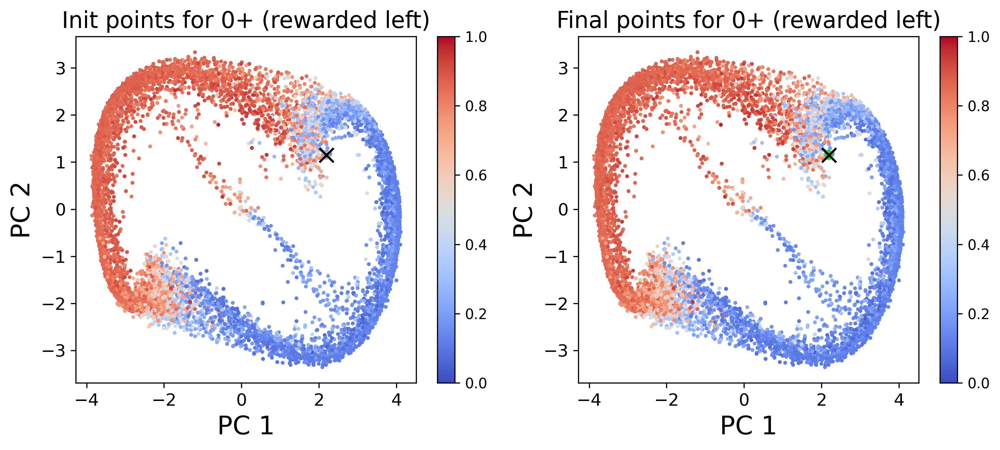

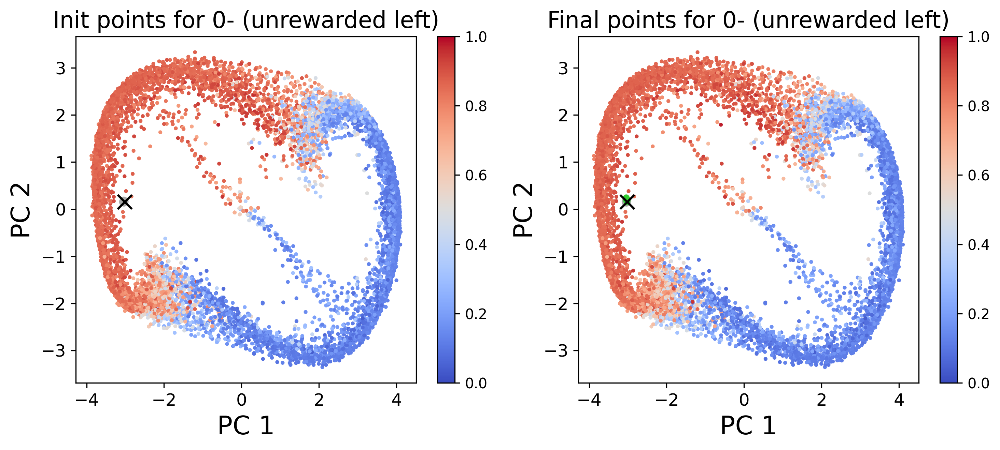

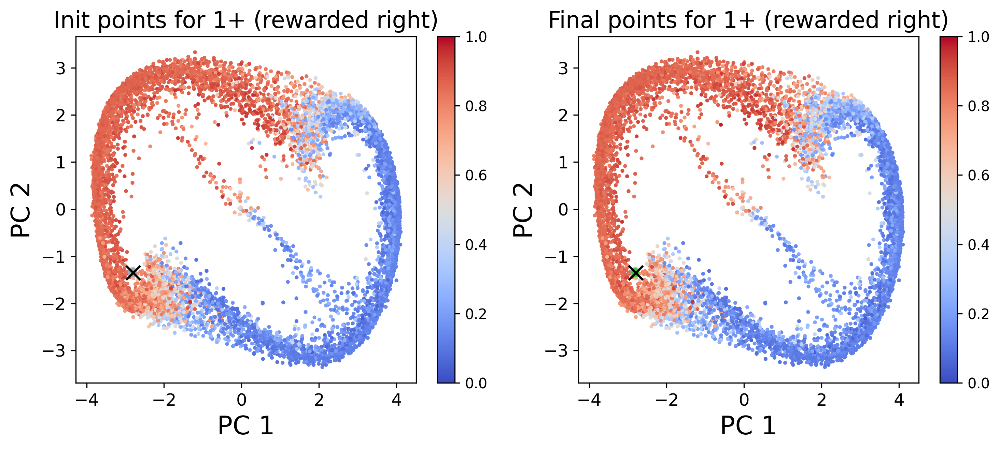

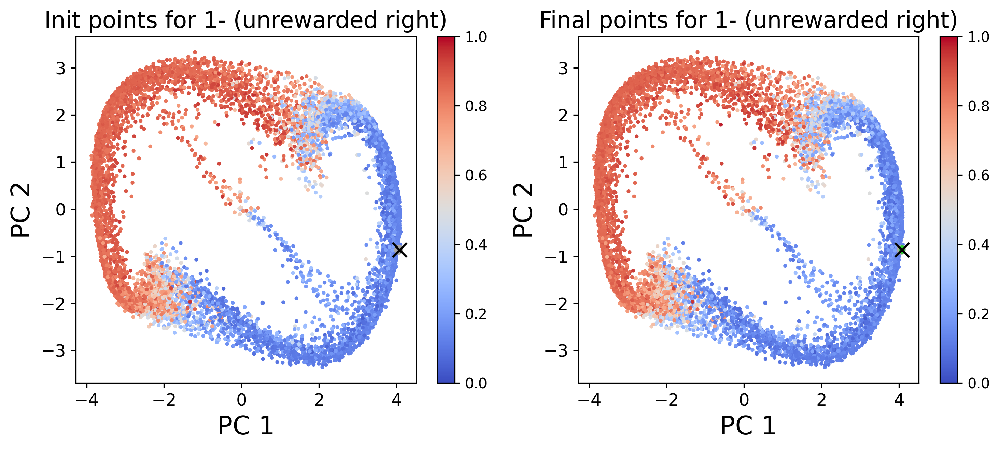

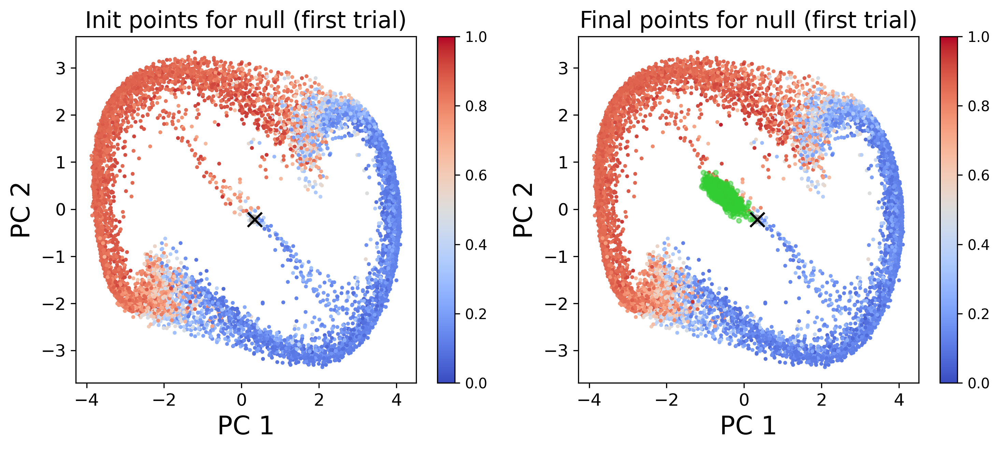

In [64]:
# Gaussian ball of 0.05
init_points_dict = init_points_dict_005
final_points_dict = final_points_dict_005

for condition in ['0+', '0-', '1+', '1-', 'null']:

    df_sorted = df_fps_per_condition[condition].sort_values(by=['q_star'], ascending=True)
    df_select = df_sorted.iloc[:10]  # only plot the slowest 10 fps
    
    # transform fixed points
    slowest_points = df_select['x_star'].values
    slowest_points = np.vstack(slowest_points[:]).astype(float)  # convert object arr to float arr
    slowest_points_mean = np.mean(slowest_points, axis=0)
    transformed_slowest_points_mean = pca_model_actor.transform(
        slowest_points_mean.reshape(-1, rnn_hidden_dim))
    
    # initialize a Gaussian ball near the slowest point
    rand_init_points = init_points_dict[condition]  # load the pre-computed data
    transformed_init_points = pca_model_actor.transform(
        rand_init_points.reshape(-1, rnn_hidden_dim))
    
    # evolve the Gaussian ball
    rand_final_points = final_points_dict[condition]  # load the pre-computed data
    transformed_rand_final_points = pca_model_actor.transform(
        rand_final_points.reshape(-1, rnn_hidden_dim))
    
    
    # pldf_fps_per_condition[condition]ot fixed points and Gaussian ball evolution
    fig, axs = plt.subplots(1,2, figsize=(10, 4.5), dpi=300)
    pc_x = 0
    pc_y = 1

    # init
    ax = axs[0]
    ax.set_title(f'Init points for {condition} ({condition_names[condition]})', fontsize=16)

    scatter = ax.scatter(
        transformed_actor_hidden_states_training_set[:, :, pc_x],
        transformed_actor_hidden_states_training_set[:, :, pc_y],
        c=a1_probs_training_set, cmap=cm.coolwarm,
        vmin=0, vmax=1, s=3
    )
    ax.scatter(
        transformed_slowest_points_mean[:, pc_x],
        transformed_slowest_points_mean[:, pc_y],
        marker='x', s=100,
        color='k', zorder=50
    )
    ax.scatter(
        transformed_init_points[:, pc_x],
        transformed_init_points[:, pc_y],
        marker='o', s=10,
        color='darkgray', alpha=0.5
    )
    ax.set_xlabel(f'PC {pc_x+1}', fontsize=18)
    ax.set_ylabel(f'PC {pc_y+1}', fontsize=18)
    
    fig.colorbar(scatter, ax=ax)
    ax.tick_params(axis='both', which='major', labelsize=12)


    ax = axs[1]
    ax.set_title(f'Final points for {condition} ({condition_names[condition]})', fontsize=16)

    scatter = ax.scatter(
        transformed_actor_hidden_states_training_set[:, :, pc_x],
        transformed_actor_hidden_states_training_set[:, :, pc_y],
        c=a1_probs_training_set, cmap=cm.coolwarm,
        vmin=0, vmax=1, s=3
    )
    ax.scatter(
        transformed_slowest_points_mean[:, pc_x],
        transformed_slowest_points_mean[:, pc_y],
        marker='x', s=100,
        color='k', zorder=50
    )
    ax.scatter(
        transformed_init_points[:, pc_x],
        transformed_init_points[:, pc_y],
        marker='o', s=10,
        color='darkgray', alpha=0.5
    )
    ax.scatter(
        transformed_rand_final_points[:, pc_x],
        transformed_rand_final_points[:, pc_y],
        marker='o', s=10,
        color='limegreen', alpha=0.5
    )
    ax.set_xlabel(f'PC {pc_x+1}', fontsize=18)
    ax.set_ylabel(f'PC {pc_y+1}', fontsize=18)
    
    fig.colorbar(scatter, ax=ax)
    ax.tick_params(axis='both', which='major', labelsize=12)

    fig.tight_layout()

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

### Network solution utilizes a series of fixed points to drag the network state in a circle based on timing of block switches between the left and right rewarded arm.

</div>

<div style="background: #DFF0D8; border-radius: 3px; padding: 10px;">

**Questions:**
1. How does empirical stability compare with linear stability analysis results?
2. How does this dynamical structure help the network have better policies than if it were continuously integrating?
3. What would the dynamics look like if there was no block structure in the task?

</div>

# Reading

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

### Mathematical background for linear dynamical systems analysis
From the supplementary information of Mante, V., Sussillo, D., Shenoy, K. et al. Context-dependent computation by recurrent dynamics in prefrontal cortex. Nature 503, 78–84 (2013). https://doi.org/10.1038/nature12742 [starting at page 26]

#### Linear Systems

Linear dynamical systems can do three basic things:
1. Expand
2. Contract
3. Oscillate (or integrate)

The primary method used to understand what a linear system is doing is by diagonalizing the interaction matrix, $M$, using an eigenvector decomposition. This decomposition is useful because it defines a basis in which certain patterns of activity, i.e. activity in special directions in state space, evolve separately from each other.

A right eigenvector, $v$, satisfies:

$$
Mv = λv 
$$

Thus, the matrix acts on these special vectors in a particularly straightforward way by scaling them by the amount $λ$, called the eigenvalue.

So the behavior of a linear dynamical system:

$$
\dot{y} = My
$$

which involves the repeated application of $M$, becomes easy to understand as, for example, the expansion (repeated scaling up) or contraction (repeated scaling down) of these vectors. 

#### Linearization
Given a continuous-time nonlinear dynamical system
$$
\dot{x} = F(x)
$$
with a fixed point $F(x^*)=0$, we can linearize its dynamics around the fixed point. 
It is convenient to introduce a new state variable as $y ≡ x-x^*$. 
The local dynamics is then described by the linear dynamical system of the form $\dot{y} = M y$, where $M$ is the Jacobian matrix calculated at $x^*$.

#### The eigenvectors are a property of the matrix

The eigenvector decomposition is:

\begin{equation}
M = REL = Σ_a r_a λ_a l_a,
\label{eq:M_REL}
\end{equation}

where $λ_a$ is the $a$-th eigenvalue, $r_a$ is the $a$-th right eigenvector (a column of $R$) and $l_a$ is the $a$-th left eigenvector (a row of $L$). The matrix $R$ is the matrix of right eigenvectors collected as columns, $L$ is the matrix of left eigenvectors collected as rows with the property that $L = R^{-1}$. The matrix $E$ is a diagonal matrix of eigenvalues.†

Looking forward, we are interested in the linearized dynamics around a fixed point in the full nonlinear system. To study those linear dynamics, we study $M$ that derives from the original nonlinear system. The way to make sense of $M$ is to use the eigenvector decomposition, defined by the equation above.

#### Diagonalization of Discrete-Time Linear Dynamical Systems

In the basis of the eigenvectors (*eigenbasis*), the local linear system is diagonalized, meaning the dynamics of all the modes evolve independently of each other. In the discrete time setting, diagonalizing the local network dynamics around a fixed point proceeds (again with $y ≡ x - x^*$) as follows:

\begin{equation}
y[t+1] = My[t]
\end{equation}

where $M$ is the interaction matrix. We can decompose $M$ using eigenvectors:

\begin{equation}
y[t+1] = (REL)y[t] 
\end{equation}

where $R$ is the matrix of right eigenvectors, $E$ is a diagonal matrix of eigenvalues, and $L = R^{-1}$ is the matrix of left eigenvectors.

To diagonalize the system, we pre-multiply both sides by $L$:

\begin{equation}
Ly[t+1] = E(Ly[t]) 
\end{equation}

This step works because:
1. $L(REL) = (LR)EL = IEL = EL$, since $LR = I$
2. We define $a[t] = Ly[t]$ as the system state in the eigenvector basis

Now each mode evolves independently:

\begin{equation}
a_i[t+1] = λ_i a_i[t]
\end{equation}

where $λ_i$ is the $i$-th eigenvalue and $a_i$ is the $i$-th component of $a$.

This diagonalization allows us to easily analyze the system's behavior in terms of expansion, contraction, oscillation for each eigenmode. Assuming all the eigenvalues are distinct, the linear dynamical system is trivially solved in this basis, giving:

\begin{equation}
a_i[t] = (λ_i)^t a_i [0]
\end{equation}

where $a_i [0]$ is the initial condition. The behavior of each mode depends on the magnitude of $λ_i$:

1. $|λ_i| > 1$: The mode expands
2. $|λ_i| < 1$: The mode contracts
3. $|λ_i| = 1$: The mode oscillates or integrates

For complex eigenvalues $λ_i = \rho_i e^{iθ_i}$, the solution can be written as:

\begin{equation}
a_i[t] = \rho_i^{t}(cos(θ_i t) + i sin(θ_i t)) a_i[0] 
\end{equation}

where $\rho_i$ determines the rate of expansion or contraction, and $θ_i$ determines the frequency of oscillation.

---

† A right eigenvector satisfies $M r_i = λ_i r_i$ and a left eigenvector satisfies $l_i M = λ_i l_i$.

‡ Note that in the discrete-time setting, integration occurs when $λ_i = 1$. This is analogous to the continuous-time case where $λ_i = 0$.

</div>

# Project ideas

<div style="border-left: 3px solid #000; padding: 1px; padding-left: 10px; background: #F0FAFF; ">

 
1. Develop task trained RNNs for neuroscience tasks, analyze their dynamical systems solutions, and examine how the dynamical motifs support computation for performing the task. [Neurogym](https://neurogym.github.io/neurogym/latest/) is a good starting point where a collection of neuroscience tasks is already implemented.

2. Develop data trained RNNs, i.e. RNNs trained to predict animals' behavior, examine how the RNN dynamics support computation for solving the task, and compare the RNN solution to hand-crafted behavioral models like Q-learning. [Disentangled RNN](https://papers.nips.cc/paper_files/paper/2023/file/c194ced51c857ec2c1928b02250e0ac8-Paper-Conference.pdf) and its [implementation](https://github.com/google-deepmind/disentangled_rnns) could be a good starting point where a more interpretable RNN architecture is proposed for modeling cognitive behavior.